In [62]:
import os
import numpy as np
import cv2
from sklearn.model_selection import train_test_split,GridSearchCV
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import classification_report, confusion_matrix
from skimage import io
from pywt import dwt2
from sklearn.preprocessing import StandardScaler

def extract_features(image):
    # Convert to grayscale
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    
    # DCT
    dct_features = cv2.dct(np.float32(gray) / 255.0)
    dct_features = dct_features.flatten()[:100]  # Take the top 100 coefficients
    
    # Wavelet Transform
    coeffs2 = dwt2(gray, 'haar')
    cA, (cH, cV, cD) = coeffs2
    wavelet_features = np.concatenate([cA.flatten(), cH.flatten(), cV.flatten(), cD.flatten()])[:100]
        
    # FFT
    f = np.fft.fft2(gray)
    fshift = np.fft.fftshift(f)
    epsilon = 1e-10  # To avoid log(0)
    magnitude_spectrum = 20 * np.log(np.abs(fshift) + epsilon)
    fft_features = magnitude_spectrum.flatten()[:100]  # Take the top 100 coefficients
    
    # Combine features
    features = np.concatenate([dct_features, wavelet_features, fft_features])
    
    # Check for NaN or infinite values
    if np.any(np.isnan(features)) or np.any(np.isinf(features)):
        return None  # Return None for invalid features
    
    return features

# Load dataset
def load_data(base_path):
    features, labels = [], []
    for label in ['real', 'fake']:
        folder_path = os.path.join(base_path, label)
        for image_name in os.listdir(folder_path):
            image_path = os.path.join(folder_path, image_name)
            image = cv2.imread(image_path)
            feature_vector = extract_features(image)
            if feature_vector is not None:  # Only append valid feature vectors
                features.append(feature_vector)
                labels.append(1 if label == 'real' else 0)  # 1 for real, 0 for fake
    return np.array(features), np.array(labels)

# Prepare data
base_path = r"C:\Desktop\ML_Implementation\data(Final_ML)\train"
X, y = load_data(base_path)

# Split into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

In [63]:
# Example: Train a K-Nearest Neighbors classifier with GridSearchCV
param_grid = {'n_neighbors': list(range(1, 31))}
knn = KNeighborsClassifier()
grid_search = GridSearchCV(knn, param_grid, cv=5, scoring='accuracy')
grid_search.fit(X_train, y_train)

# Best estimator
best_knn = grid_search.best_estimator_

# Predictions
y_pred = best_knn.predict(X_test)

# Evaluation
print("Confusion Matrix:")
print(confusion_matrix(y_test, y_pred))

print("\nClassification Report:")
print(classification_report(y_test, y_pred))

Confusion Matrix:
[[474  26]
 [348 225]]

Classification Report:
              precision    recall  f1-score   support

           0       0.58      0.95      0.72       500
           1       0.90      0.39      0.55       573

    accuracy                           0.65      1073
   macro avg       0.74      0.67      0.63      1073
weighted avg       0.75      0.65      0.63      1073



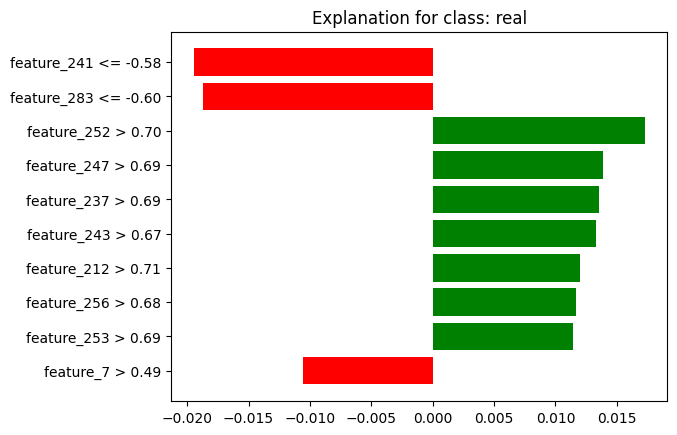

In [64]:
# Initialize LIME Tabular Explainer
explainer = lime_tabular.LimeTabularExplainer(
    training_data=X_train,                            # Training feature vectors
    feature_names=[f'feature_{i}' for i in range(X_train.shape[1])],  # Feature names
    class_names=['real', 'fake'],                    # Class names (adjust accordingly)
    mode='classification',                           # Mode for classification
    discretize_continuous=True                       # Discretize continuous features
)

# Define the prediction function for LIME
def predict_proba_fn(features):
    return best_knn.predict_proba(features)

# Select a sample from the test set (e.g., the first test sample)
sample = X_test[0].reshape(1, -1)

# Generate explanation using LIME
explanation = explainer.explain_instance(
    data_row=sample[0],                # The instance to explain
    predict_fn=predict_proba_fn,       # Prediction function
    num_features=10,                   # Number of top features to display
    top_labels=2                       # Number of top labels to explain
)

# Display explanation in the notebook
explanation.show_in_notebook(show_table=True, show_all=False)

# Or, visualize using matplotlib
fig = explanation.as_pyplot_figure(label=explanation.top_labels[0])
plt.title(f'Explanation for class: {explainer.class_names[explanation.top_labels[0]]}')
plt.show()

In [65]:
# Perceptron implementation with sigmoid for probability
class Perceptron:
    def __init__(self, learning_rate=0.01, n_iters=1000):
        self.lr = learning_rate
        self.n_iters = n_iters
        self.weights = None
        self.bias = None

    def fit(self, X, y):
        n_samples, n_features = X.shape
        self.weights = np.zeros(n_features)
        self.bias = 0

        for _ in range(self.n_iters):
            for idx, x_i in enumerate(X):
                linear_output = np.dot(x_i, self.weights) + self.bias
                y_predicted = self._activation_function(linear_output)
                update = self.lr * (y[idx] - y_predicted)
                self.weights += update * x_i
                self.bias += update

    def predict(self, X):
        linear_output = np.dot(X, self.weights) + self.bias
        y_predicted = self._activation_function(linear_output)
        return y_predicted

    def predict_proba(self, X):
        linear_output = np.dot(X, self.weights) + self.bias
        proba = sigmoid(linear_output)
        return np.stack([1 - proba, proba], axis=1)

    def _activation_function(self, x):
        return np.where(x >= 0, 1, 0)

# Sigmoid function for probabilities
def sigmoid(x):
    return 1 / (1 + np.exp(-x))

# Initialize and train the Perceptron
perceptron = Perceptron(learning_rate=0.01, n_iters=1000)
perceptron.fit(X_train, y_train)

# Make predictions
y_pred = perceptron.predict(X_test)

# Evaluation
print("Confusion Matrix:")
print(confusion_matrix(y_test, y_pred))

print("\nClassification Report:")
print(classification_report(y_test, y_pred))

Confusion Matrix:
[[347 153]
 [180 393]]

Classification Report:
              precision    recall  f1-score   support

           0       0.66      0.69      0.68       500
           1       0.72      0.69      0.70       573

    accuracy                           0.69      1073
   macro avg       0.69      0.69      0.69      1073
weighted avg       0.69      0.69      0.69      1073



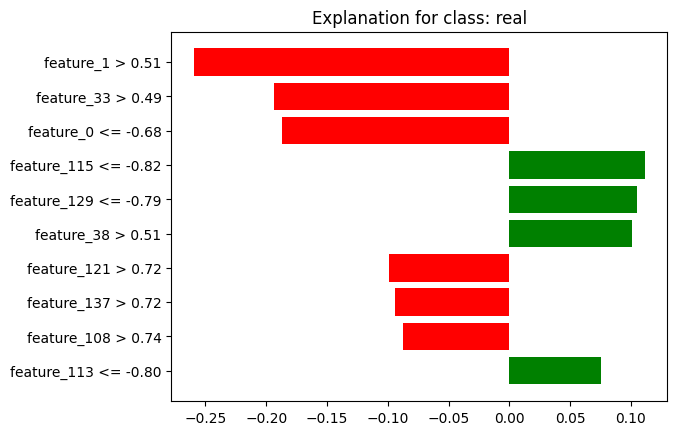

In [66]:
# Initialize LIME Tabular Explainer
explainer = lime_tabular.LimeTabularExplainer(
    training_data=X_train,
    feature_names=[f'feature_{i}' for i in range(X_train.shape[1])],
    class_names=['real', 'fake'],
    mode='classification',
    discretize_continuous=True
)

# Define prediction function for LIME
def predict_proba_fn(features):
    return perceptron.predict_proba(features)

# Select a sample to explain
sample = X_test[0].reshape(1, -1)

# Generate explanation
explanation = explainer.explain_instance(
    data_row=sample[0],
    predict_fn=predict_proba_fn,
    num_features=10,
    top_labels=2
)

# Display explanation in the notebook
explanation.show_in_notebook(show_table=True, show_all=False)

# Or, visualize using matplotlib
fig = explanation.as_pyplot_figure(label=explanation.top_labels[0])
plt.title(f'Explanation for class: {explainer.class_names[explanation.top_labels[0]]}')
plt.show()

In [67]:
from sklearn.svm import SVC
# Initialize SVM classifier
svm_classifier = SVC(kernel='linear', random_state=42, probability=True)
# Train the model on the full training set
svm_classifier.fit(X_train, y_train)

# Make predictions
y_pred = svm_classifier.predict(X_test)

# Performance metrics
print("Classification Report:\n", classification_report(y_test, y_pred))
print("Confusion Matrix:\n", confusion_matrix(y_test, y_pred))

# To return probabilities, you can use the `predict_proba` function
y_prob = svm_classifier.predict_proba(X_test)  # This will return the predicted probabilities
print("Predicted Probabilities:\n", y_prob)


Classification Report:
               precision    recall  f1-score   support

           0       0.72      0.70      0.71       500
           1       0.75      0.76      0.76       573

    accuracy                           0.74      1073
   macro avg       0.73      0.73      0.73      1073
weighted avg       0.74      0.74      0.74      1073

Confusion Matrix:
 [[351 149]
 [135 438]]
Predicted Probabilities:
 [[0.5814174  0.4185826 ]
 [0.06500987 0.93499013]
 [0.45468344 0.54531656]
 ...
 [0.91101978 0.08898022]
 [0.76181958 0.23818042]
 [0.73494913 0.26505087]]


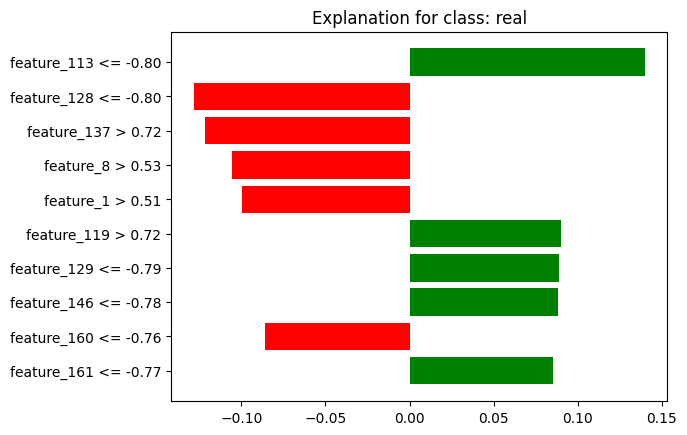

In [68]:
from lime import lime_tabular
import matplotlib.pyplot as plt

# Initialize LIME Tabular Explainer
explainer = lime_tabular.LimeTabularExplainer(
    training_data=X_train,                             # Training feature vectors
    feature_names=[f'feature_{i}' for i in range(X_train.shape[1])],  # Feature names
    class_names=['real', 'fake'],                      # Class names
    mode='classification',                             # Mode
    discretize_continuous=True                          # Discretize features
)

# Define prediction function for LIME
def predict_proba_fn(features):
    return svm_classifier.predict_proba(features)

# Select a sample for explanation (e.g., first test sample)
sample = X_test[0].reshape(1, -1)

# Generate explanation
explanation = explainer.explain_instance(
    data_row=sample[0],          # The instance to explain
    predict_fn=predict_proba_fn, # Prediction function
    num_features=10,             # Number of top features to display
    top_labels=2                 # Number of top labels to explain
)

# Display the explanation in the notebook
explanation.show_in_notebook(show_table=True, show_all=False)

# Alternatively, visualize using matplotlib
fig = explanation.as_pyplot_figure(label=explanation.top_labels[0])
plt.title(f'Explanation for class: {explainer.class_names[explanation.top_labels[0]]}')
plt.show()

In [69]:
from sklearn.tree import DecisionTreeClassifier
# Initialize the Decision Tree Classifier
decision_tree = DecisionTreeClassifier(random_state=42)
# Fit the model on the training data
decision_tree.fit(X_train, y_train)

# Make predictions
y_pred = decision_tree.predict(X_test)

# Performance Metrics
print(classification_report(y_test, y_pred))
print(confusion_matrix(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.67      0.69      0.68       500
           1       0.72      0.70      0.71       573

    accuracy                           0.69      1073
   macro avg       0.69      0.69      0.69      1073
weighted avg       0.70      0.69      0.69      1073

[[346 154]
 [174 399]]


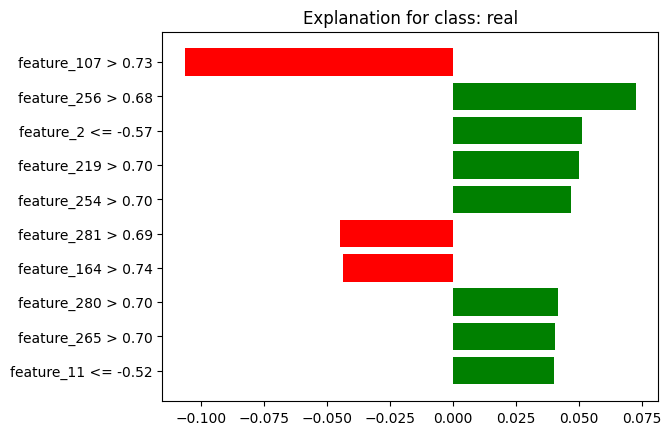

In [102]:
# Initialize LIME Tabular Explainer
explainer = lime_tabular.LimeTabularExplainer(
    training_data=X_train,                            # Training feature vectors
    feature_names=[f'feature_{i}' for i in range(X_train.shape[1])],  # Feature names
    class_names=['real', 'fake'],                    # Class names
    mode='classification',                           # Mode of explanation
    discretize_continuous=True                       # Discretize continuous features
)

# Define a prediction function for LIME
def predict_proba_fn(features):
    return decision_tree.predict_proba(features)

# Select a sample for explanation (e.g., the first test sample)
sample = X_test[0].reshape(1, -1)

# Generate an explanation for the selected instance
explanation = explainer.explain_instance(
    data_row=sample[0],                # The instance to explain
    predict_fn=predict_proba_fn,       # Prediction function
    num_features=10,                   # Number of top features to display
    top_labels=2                       # Number of top labels to explain
)

# Display the explanation in the notebook
explanation.show_in_notebook(show_table=True, show_all=False)

# Alternatively, visualize using matplotlib
fig = explanation.as_pyplot_figure(label=explanation.top_labels[0])
plt.title(f'Explanation for class: {explainer.class_names[explanation.top_labels[0]]}')
plt.show()

In [71]:
from sklearn.ensemble import RandomForestClassifier
# Initialize the Random Forest Classifier with chosen parameters
random_forest = RandomForestClassifier(n_estimators=200, max_depth=20, random_state=42)

# Fit the model to the training data
random_forest.fit(X_train, y_train)

# Make predictions on the test set
y_pred = random_forest.predict(X_test)

# Performance Metrics
print(classification_report(y_test, y_pred))
print(confusion_matrix(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.80      0.76      0.78       500
           1       0.80      0.83      0.81       573

    accuracy                           0.80      1073
   macro avg       0.80      0.79      0.79      1073
weighted avg       0.80      0.80      0.80      1073

[[378 122]
 [ 97 476]]


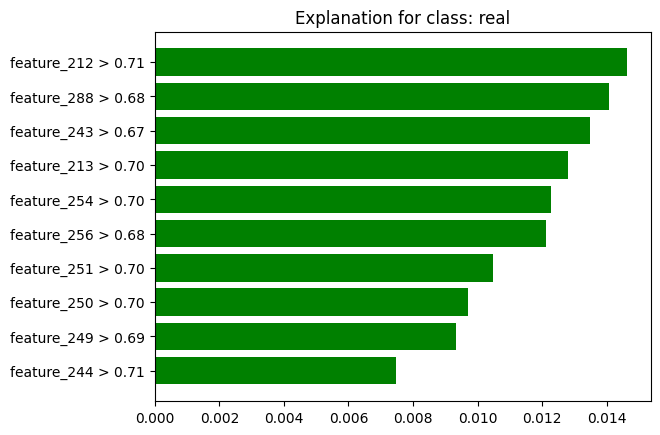

In [72]:
# Initialize LIME Tabular Explainer
explainer = lime_tabular.LimeTabularExplainer(
    training_data=X_train,                            # Training feature vectors
    feature_names=[f'feature_{i}' for i in range(X_train.shape[1])],  # Feature names
    class_names=['real', 'fake'],                    # Class names
    mode='classification',                           # Mode for classification
    discretize_continuous=True                       # Discretize continuous features
)

# Define the prediction function
def predict_proba_fn(features):
    return random_forest.predict_proba(features)

# Select a sample for explanation (e.g., the first test sample)
sample = X_test[0].reshape(1, -1)

# Generate an explanation for the selected instance
explanation = explainer.explain_instance(
    data_row=sample[0],                # The instance to explain
    predict_fn=predict_proba_fn,       # Prediction function
    num_features=10,                   # Number of top features to display
    top_labels=2                       # Number of top labels to explain
)

# Display the explanation in the notebook
explanation.show_in_notebook(show_table=True, show_all=False)

# Alternatively, visualize using matplotlib
fig = explanation.as_pyplot_figure(label=explanation.top_labels[0])
plt.title(f'Explanation for class: {explainer.class_names[explanation.top_labels[0]]}')
plt.show()

In [73]:
from catboost import CatBoostClassifier
# Initialize the CatBoost Classifier
catboost_model = CatBoostClassifier(iterations=1000, depth=6, learning_rate=0.1, random_seed=42, verbose=0)

# Fit the model to the training data
catboost_model.fit(X_train, y_train)

# Make predictions on the test set
y_pred = catboost_model.predict(X_test)

# Performance Metrics
print(classification_report(y_test, y_pred))
print(confusion_matrix(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.86      0.83      0.84       500
           1       0.85      0.88      0.87       573

    accuracy                           0.86      1073
   macro avg       0.86      0.85      0.85      1073
weighted avg       0.86      0.86      0.86      1073

[[414  86]
 [ 69 504]]


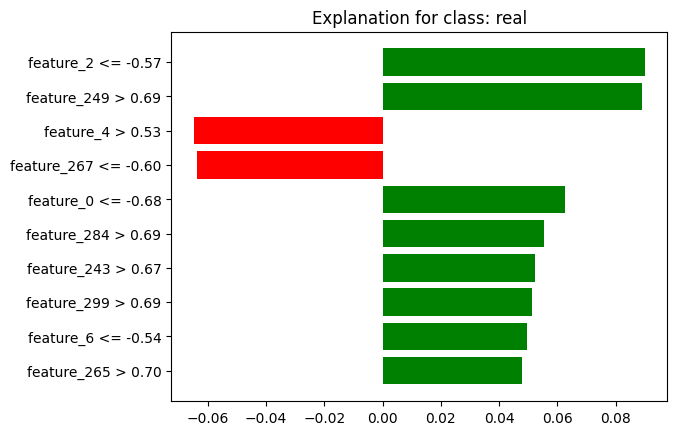

In [74]:
# Initialize LIME Tabular Explainer
explainer = lime_tabular.LimeTabularExplainer(
    training_data=X_train,                            # Training feature vectors
    feature_names=[f'feature_{i}' for i in range(X_train.shape[1])],  # Feature names
    class_names=['real', 'fake'],                    # Class names (adjust as needed)
    mode='classification',                           # Mode for classification
    discretize_continuous=True                       # Discretize continuous features
)

# Define the prediction function
def predict_proba_fn(features):
    return catboost_model.predict_proba(features)

# Select a sample for explanation (e.g., the first test sample)
sample = X_test[0].reshape(1, -1)

# Generate an explanation for the selected instance
explanation = explainer.explain_instance(
    data_row=sample[0],                # The instance to explain
    predict_fn=predict_proba_fn,       # Prediction function
    num_features=10,                   # Number of top features to display
    top_labels=2                       # Number of top labels to explain
)

# Display the explanation in the notebook
explanation.show_in_notebook(show_table=True, show_all=False)

# Alternatively, visualize using matplotlib
fig = explanation.as_pyplot_figure(label=explanation.top_labels[0])
plt.title(f'Explanation for class: {explainer.class_names[explanation.top_labels[0]]}')
plt.show()

In [75]:
from sklearn.ensemble import AdaBoostClassifier
# Initialize the base estimator for AdaBoost (e.g., a DecisionTree)
base_estimator = DecisionTreeClassifier(max_depth=1)

# Initialize the AdaBoost Classifier
adaboost_model = AdaBoostClassifier(base_estimator=base_estimator, n_estimators=100, learning_rate=1.0, random_state=42)

# Fit the model to the training data
adaboost_model.fit(X_train, y_train)

# Make predictions on the test set
y_pred = adaboost_model.predict(X_test)

# Performance Metrics
print(classification_report(y_test, y_pred))
print(confusion_matrix(y_test, y_pred))

C:\Users\ru368\AppData\Roaming\Python\Python312\site-packages\sklearn\ensemble\_base.py:156: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(


              precision    recall  f1-score   support

           0       0.79      0.77      0.78       500
           1       0.80      0.83      0.81       573

    accuracy                           0.80      1073
   macro avg       0.80      0.80      0.80      1073
weighted avg       0.80      0.80      0.80      1073

[[383 117]
 [ 99 474]]


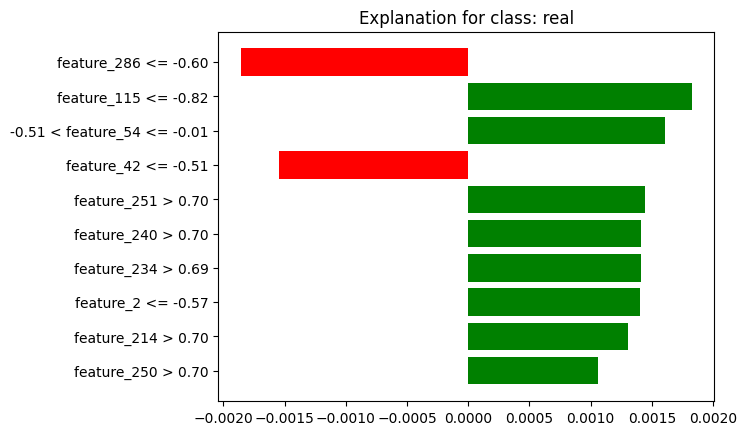

In [76]:
# Initialize LIME Tabular Explainer
explainer = lime_tabular.LimeTabularExplainer(
    training_data=X_train,                            # Training feature vectors
    feature_names=[f'feature_{i}' for i in range(X_train.shape[1])],  # Feature names
    class_names=['real', 'fake'],                    # Class names (adjust as needed)
    mode='classification',                           # Mode for classification
    discretize_continuous=True                       # Discretize continuous features
)

# Define the prediction function
def predict_proba_fn(features):
    return adaboost_model.predict_proba(features)

# Select a sample for explanation (e.g., the first test sample)
sample = X_test[0].reshape(1, -1)

# Generate an explanation for the selected instance
explanation = explainer.explain_instance(
    data_row=sample[0],                # The instance to explain
    predict_fn=predict_proba_fn,       # Prediction function
    num_features=10,                   # Number of top features to display
    top_labels=2                       # Number of top labels to explain
)

# Display the explanation in the notebook
explanation.show_in_notebook(show_table=True, show_all=False)

# Alternatively, visualize using matplotlib
fig = explanation.as_pyplot_figure(label=explanation.top_labels[0])
plt.title(f'Explanation for class: {explainer.class_names[explanation.top_labels[0]]}')
plt.show()

In [77]:
from xgboost import XGBClassifier
# Initialize the XGBoost Classifier
xgb_model = XGBClassifier(n_estimators=200, learning_rate=0.1, max_depth=5, random_state=42)

# Fit the model to the training data
xgb_model.fit(X_train, y_train)

# Make predictions on the test set
y_pred = xgb_model.predict(X_test)

# Performance Metrics
print(classification_report(y_test, y_pred))
print(confusion_matrix(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.85      0.83      0.84       500
           1       0.85      0.87      0.86       573

    accuracy                           0.85      1073
   macro avg       0.85      0.85      0.85      1073
weighted avg       0.85      0.85      0.85      1073

[[415  85]
 [ 76 497]]


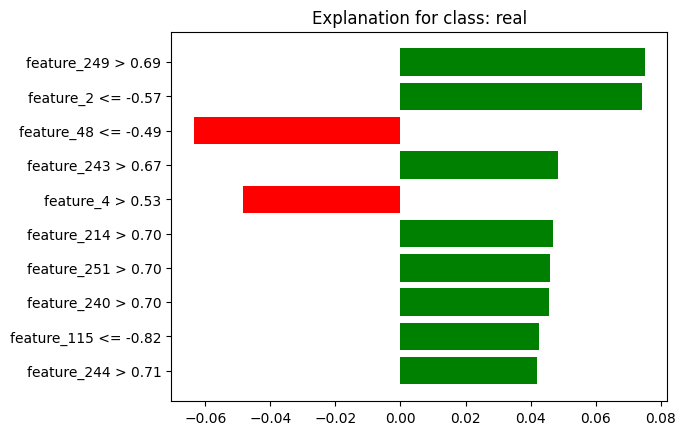

In [78]:
# Initialize LIME Tabular Explainer
explainer = lime_tabular.LimeTabularExplainer(
    training_data=X_train,                            # Training feature vectors
    feature_names=[f'feature_{i}' for i in range(X_train.shape[1])],  # Feature names
    class_names=['real', 'fake'],                    # Class names (adjust as needed)
    mode='classification',                           # Mode for classification
    discretize_continuous=True                       # Discretize continuous features
)

# Define the prediction function
def predict_proba_fn(features):
    return xgb_model.predict_proba(features)

# Select a sample for explanation (e.g., the first test sample)
sample = X_test[0].reshape(1, -1)

# Generate an explanation for the selected instance
explanation = explainer.explain_instance(
    data_row=sample[0],                # The instance to explain
    predict_fn=predict_proba_fn,       # Prediction function
    num_features=10,                   # Number of top features to display
    top_labels=2                       # Number of top labels to explain
)

# Display the explanation in the notebook
explanation.show_in_notebook(show_table=True, show_all=False)

# Alternatively, visualize using matplotlib
fig = explanation.as_pyplot_figure(label=explanation.top_labels[0])
plt.title(f'Explanation for class: {explainer.class_names[explanation.top_labels[0]]}')
plt.show()

In [79]:
from sklearn.naive_bayes import GaussianNB
# Initialize the Naive Bayes Classifier
naive_bayes_model = GaussianNB()

# Fit the model to the training data
naive_bayes_model.fit(X_train, y_train)

# Make predictions on the test set
y_pred = naive_bayes_model.predict(X_test)

# Performance Metrics
print(classification_report(y_test, y_pred))
print(confusion_matrix(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.70      0.73      0.72       500
           1       0.76      0.73      0.74       573

    accuracy                           0.73      1073
   macro avg       0.73      0.73      0.73      1073
weighted avg       0.73      0.73      0.73      1073

[[366 134]
 [157 416]]


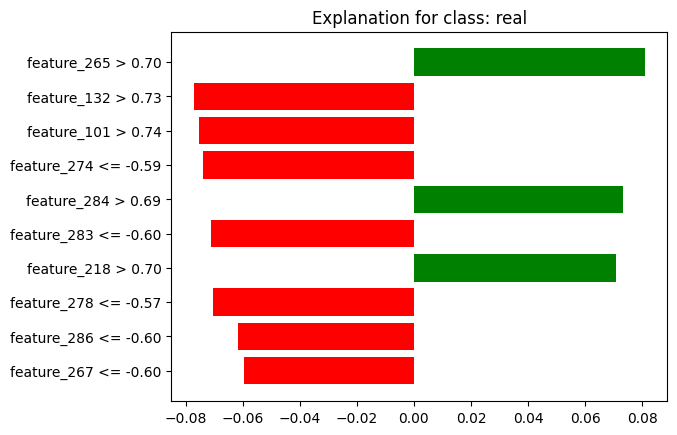

In [80]:
# Initialize LIME Tabular Explainer
explainer = lime_tabular.LimeTabularExplainer(
    training_data=X_train,                            # Training feature vectors
    feature_names=[f'feature_{i}' for i in range(X_train.shape[1])],  # Feature names
    class_names=['real', 'fake'],                    # Class names (adjust accordingly)
    mode='classification',                           # Mode for classification
    discretize_continuous=True                       # Discretize continuous features
)

# Define the prediction function for LIME
def predict_proba_fn(features):
    return naive_bayes_model.predict_proba(features)

# Select a sample from the test set (e.g., the first test sample)
sample = X_test[0].reshape(1, -1)

# Generate explanation using LIME
explanation = explainer.explain_instance(
    data_row=sample[0],                # The instance to explain
    predict_fn=predict_proba_fn,       # Prediction function
    num_features=10,                   # Number of top features to display
    top_labels=2                       # Number of top labels to explain
)

# Display explanation in the notebook
explanation.show_in_notebook(show_table=True, show_all=False)

# Or, visualize using matplotlib
fig = explanation.as_pyplot_figure(label=explanation.top_labels[0])
plt.title(f'Explanation for class: {explainer.class_names[explanation.top_labels[0]]}')
plt.show()